<a href="https://colab.research.google.com/github/Dechrist2021/Mulomba/blob/main/Github_Resilience_projection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import ConvLSTM2D, Flatten, Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import ConvLSTM2D, Flatten, Dense
from datetime import datetime
from datetime import timedelta
import lightgbm as lgb
from lightgbm import LGBMRegressor
from sklearn.svm import SVR

In [ ]:
from google.colab import files
files.upload()

Saving GlobalWeatherRepository.csv to GlobalWeatherRepository.csv


{'GlobalWeatherRepository.csv': b"country,location_name,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,condition_text,wind_mph,wind_kph,wind_degree,wind_direction,pressure_mb,pressure_in,precip_mm,precip_in,humidity,cloud,feels_like_celsius,feels_like_fahrenheit,visibility_km,visibility_miles,uv_index,gust_mph,gust_kph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination\nAfghanistan,Kabul,34.52,69.18,Asia/Kabul,1693301400,2023-08-29 14:00,28.8,83.8,Sunny,7.2,11.5,74,ENE,1004.0,29.64,0.0,0.0,19,0,26.7,80.1,10.0,6.0,7.0,8.3,13.3,647.5,130.2,1.2,0.4,7.9,11.1,1,1,05:24 AM,06:24 PM,05:39 PM,02:48 AM,Waxing Gibbous,93\nAlbania,Tirana,41.33,19.82,Europe/Tirane,1693301400,2023-08-29 11:30,27.0,80.6,Partly cloudy,3.8,6.1,210,SSW,1006.0,29.71,0.

In [ ]:
df = pd.read_csv('GlobalWeatherRepository.csv')

**“Air Quality Projections: An Insight from Explainable Machine Learning Techniques”**: Given the real-time nature of the data, machine learning can be used to predict short-term changes in the Air Quality Index based on parameters like 'air_quality_Carbon_Monoxide', 'air_quality_Ozone', 'air_quality_Nitrogen_dioxide', etc. This can be crucial in issuing timely health advisories during events like wildfires or industrial accidents.

The features you listed can be grouped into three main categories:

1. **Meteorological Features**: These are features related to weather conditions.
    - 'temperature_celsius'
    - 'wind_mph'
    - 'wind_degree'
    - 'wind_direction'
    - 'pressure_mb'
    - 'precip_mm'
    - 'humidity'
    - 'cloud'
    - 'feels_like_celsius'
    - 'visibility_km'
    - 'uv_index'
    - 'gust_mph'

2. **Air Quality Index Features**: These are features related to the air quality index.
    - 'air_quality_gb-defra-index'

3. **Air Pollutant Features**: These are features related to specific air pollutants.
    - 'air_quality_Carbon_Monoxide'
    - 'air_quality_Ozone'
    - 'air_quality_Nitrogen_dioxide'
    - 'air_quality_Sulphur_dioxide'
    - 'air_quality_PM2.5'
    - 'air_quality_PM10'

4. ** Demographic features to consider: [Population, population byage group]
5. ** Economic features to consider: [GDP, GNI, employment rate,etc]

Each of these groups provides different types of information that can be useful in various contexts, such as weather forecasting, air quality monitoring, and environmental research.

In [ ]:
# Transforming date
df['last_updated'] = pd.to_datetime(df['last_updated'])

# Extract the date part
df['last_updated'] = df['last_updated'].dt.date

df['last_updated']

0        2023-08-29
1        2023-08-29
2        2023-08-29
3        2023-08-29
4        2023-08-29
            ...    
12270    2023-10-29
12271    2023-10-29
12272    2023-10-29
12273    2023-10-31
12274    2023-10-30
Name: last_updated, Length: 12275, dtype: object

In [ ]:
df.columns

Index(['country', 'location_name', 'latitude', 'longitude', 'timezone',
       'last_updated_epoch', 'last_updated', 'temperature_celsius',
       'temperature_fahrenheit', 'condition_text', 'wind_mph', 'wind_kph',
       'wind_degree', 'wind_direction', 'pressure_mb', 'pressure_in',
       'precip_mm', 'precip_in', 'humidity', 'cloud', 'feels_like_celsius',
       'feels_like_fahrenheit', 'visibility_km', 'visibility_miles',
       'uv_index', 'gust_mph', 'gust_kph', 'air_quality_Carbon_Monoxide',
       'air_quality_Ozone', 'air_quality_Nitrogen_dioxide',
       'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10',
       'air_quality_us-epa-index', 'air_quality_gb-defra-index', 'sunrise',
       'sunset', 'moonrise', 'moonset', 'moon_phase', 'moon_illumination'],
      dtype='object')

In [ ]:
# Selecting important columns
data = df[['location_name','last_updated', 'temperature_celsius','wind_mph','wind_degree', 'wind_direction',
           'pressure_mb','precip_mm','humidity', 'cloud', 'feels_like_celsius','visibility_km','uv_index', 'gust_mph',
           'air_quality_Carbon_Monoxide','air_quality_Ozone','air_quality_Nitrogen_dioxide','air_quality_Sulphur_dioxide',
           'air_quality_PM2.5', 'air_quality_PM10','air_quality_gb-defra-index']]
data = data.set_index('last_updated')

In [ ]:
data.columns

Index(['location_name', 'temperature_celsius', 'wind_mph', 'wind_degree',
       'wind_direction', 'pressure_mb', 'precip_mm', 'humidity', 'cloud',
       'feels_like_celsius', 'visibility_km', 'uv_index', 'gust_mph',
       'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
       'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
       'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_gb-defra-index'],
      dtype='object')

In [ ]:
# Check number of records for each date
records_per_day = data.groupby('last_updated').size()

# Check number of unique locations for each date
locations_per_day = data.groupby('last_updated')['location_name'].nunique()

# Compare these two Series objects
are_records_complete = (records_per_day == locations_per_day)

# Print dates with incomplete records
print(are_records_complete[are_records_complete == False])

last_updated
2023-08-29    False
2023-08-30    False
2023-09-08    False
2023-09-11    False
2023-09-12    False
2023-09-14    False
2023-09-15    False
2023-09-27    False
2023-09-29    False
2023-10-01    False
2023-10-03    False
2023-10-12    False
2023-10-15    False
2023-10-16    False
2023-10-18    False
2023-10-20    False
2023-10-29    False
dtype: bool


In [ ]:
# Get the unique locations
unique_locations = data['location_name'].unique()

# Reseting index of data
data_reset = data.reset_index()
# Dates with missing records
missing_dates = are_records_complete[are_records_complete == False].index

# Check which locations are missing on each date
for date in missing_dates:
    recorded_locations = data_reset[data_reset['last_updated'] == date]['location_name'].unique()
    missing_locations = set(unique_locations) - set(recorded_locations)
    print(f"On {date}, data is missing for these locations: {missing_locations}")

On 2023-08-29, data is missing for these locations: {'Dili', 'Kyiv'}
On 2023-08-30, data is missing for these locations: {'Dili', 'Kyiv'}
On 2023-09-08, data is missing for these locations: {'Dili', 'Lviv'}
On 2023-09-11, data is missing for these locations: {'Malabo', "N'djamena", 'Porto-Novo', 'Rabat', 'Bafoussam', 'Murong Timor', 'Lviv', 'Bangui', 'Brazzaville', 'Luanda'}
On 2023-09-12, data is missing for these locations: {'Murong Timor', 'Lviv'}
On 2023-09-14, data is missing for these locations: {'Suva', 'Tarawa', 'Nuku`Aloia', 'Port Moresby', 'Murong Timor', 'Wellington', 'Majuro', 'Lviv', 'Palikir', 'Apia', 'Canberra', 'Funafuti', 'Port Vila', 'Honiara'}
On 2023-09-15, data is missing for these locations: {'Murong Timor', 'Lviv'}
On 2023-09-27, data is missing for these locations: {'Murong Timor', 'Lviv', 'Ulaanbaatar', 'Apia', 'Madrid', 'Tarawa'}
On 2023-09-29, data is missing for these locations: {'Murong Timor', 'Lviv'}
On 2023-10-01, data is missing for these locations: {'M

In [ ]:
missing_dates.shape[0] / data_reset.index.shape[0]

0.001384928716904277

In [ ]:
missing_locations

{'Lviv', 'Murong Timor'}

Data Frame Expansion and Missing Data Imputation.

In [ ]:
# Get all unique dates and locations
#unique_dates = data.index.unique()
#unique_locations = data['location_name'].unique()

# Create a MultiIndex that represents the complete set of records
#mux = pd.MultiIndex.from_product([unique_dates, unique_locations], names=['last_updated', 'location_name'])

# Create a new DataFrame with this MultiIndex
#complete_data = pd.DataFrame(index=mux).reset_index()

# Merge the new DataFrame with the original one
#merged_data = pd.merge(complete_data, data.reset_index(), how='left', on=['last_updated', 'location_name'])

# Replace NaN values with a value of your choice (e.g., np.nan, 'unknown', etc.)
#merged_data.fillna(np.nan, inplace=True)

# Set 'last_updated' as the index again
#merged_data.set_index('last_updated', inplace=True)

In [ ]:
#merged_data

In [ ]:
# Get the minimum and maximum dates from the original data
#min_date = data.index.min()
#max_date = data.index.max()

# Filter the merged data based on these dates
#filtered_merged_data = merged_data[(merged_data.index >= min_date) & (merged_data.index < max_date)]
#filtered_merged_data

In [ ]:
# Fill missing values with mode
#merged_data_filled_mode = merged_data.apply(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else np.nan))
#merged_data_filled_mode

In [ ]:
#merged_data_filled_mode.isna().sum()

In [ ]:
# Check number of records for each date
#records_per_day = merged_data_filled_mode.groupby('last_updated').size()

# Check number of unique locations for each date
#locations_per_day = merged_data_filled_mode.groupby('last_updated')['location_name'].nunique()

# Compare these two Series objects
#are_records_complete = (records_per_day == locations_per_day)

# Print dates with incomplete records
#print(are_records_complete[are_records_complete == False])

In [ ]:
# Get the unique locations
#unique_locations = merged_data_filled_mode['location_name'].unique()

# Reseting index of data
#data_reset = merged_data_filled_mode.reset_index()
# Dates with missing records
#missing_dates = are_records_complete[are_records_complete == False].index

# Check which locations are missing on each date
#for date in missing_dates:
#    recorded_locations = data_reset[data_reset['last_updated'] == date]['location_name'].unique()
#    missing_locations = set(unique_locations) - set(recorded_locations)
#    print(f"On {date}, data is missing for these locations: {missing_locations}")

In [ ]:
# labelilng and Scaling data
# Labeling objects
data_scaled = data.copy()
le = LabelEncoder()
object_cols = data_scaled.iloc[:,1:].select_dtypes(include=['object']).columns

for col in object_cols:
  data_scaled[col] = le.fit_transform(data_scaled.iloc[:,1:][col])

# Sacling using MinMaxScaler
scalers = {}
for col in ['temperature_celsius', 'wind_mph', 'wind_degree','wind_direction', 'pressure_mb', 'precip_mm', 'humidity', 'cloud',
       'feels_like_celsius', 'visibility_km', 'uv_index', 'gust_mph','air_quality_Carbon_Monoxide', 'air_quality_Ozone',
       'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide','air_quality_PM2.5', 'air_quality_PM10', 'air_quality_gb-defra-index']:
            scaler = MinMaxScaler()
            data_scaled[col] = data_scaled.groupby('location_name')[col].transform(lambda x: scaler.fit_transform(x.values.reshape(-1, 1))[:,0])
            scalers[col] = scaler

In [ ]:
# Preparing the data for timeseries forecasting
# Split target and features from train and test
def create_dataset(data_reset, look_back=1):
  X, Y, dates = [], [], []
  for location_name, group in data_reset.groupby('location_name'):
    values = group.values
    for i in range(len(values)-look_back-1):
      a = values[i:(i+look_back), 1:]
      b = values[i+look_back, -1]
      date = values[i+look_back, 0]
      X.append(a)
      Y.append(b)
      dates.append(date)
  return np.array(X), np.array(Y), dates

# Resetting index on the scaled data
data_scaled_reset = data_scaled.reset_index()

look_back = 1
Xtrain, ytrain, train_dates = create_dataset(data_scaled_reset, look_back)

# Reshaping features in a suitable format for the ML models
Xtrain_reshaped = Xtrain.reshape(Xtrain.shape[0],(Xtrain.shape[1]*Xtrain.shape[2]))

# Unique articles in train and test after reshaping
print('Number of country in train:', len(np.unique(Xtrain_reshaped[:,:1])))
print('Shapes:',Xtrain_reshaped.shape,ytrain.shape)

Number of country in train: 197
Shapes: (11881, 20) (11881,)


In [ ]:
# Evaluating the performance of different regressors
def train_and_evaluate(Xtrain_reshaped, ytrain):
    # Initialize the regressors
    regressors = [
        LinearRegression(),
        Ridge(),
        Lasso(),
        ElasticNet(),
        DecisionTreeRegressor(),
        RandomForestRegressor(),
        XGBRegressor(),
        LGBMRegressor(),
        SVR()
    ]

    # Train and evaluate each regressor
    for regressor in regressors:
        # Train the model
        regressor.fit(Xtrain_reshaped, ytrain)

        # Make predictions on the training set and calculate metrics
        ypred_train = regressor.predict(Xtrain_reshaped)
        mse_train = mean_squared_error(ytrain, ypred_train)
        r2_train = r2_score(ytrain, ypred_train)
        residuals = ytrain - ypred_train

        # Perform 5-fold cross validation
        scores = cross_val_score(regressor, Xtrain_reshaped, ytrain, cv=5)

        # Print cross-validation scores and training set metrics
        print("Regressor:", regressor.__class__.__name__)
        print("Cross-validation scores: ", scores)
        print('MSE train:' ,mse_train)
        print('R2 score train:', r2_train)
        print('Mean residuals:', np.mean(residuals))
        print()

# Calling the train and evaluation function ignoring the first columns which is the item Id
train_and_evaluate(Xtrain_reshaped[:,1:], ytrain)

Regressor: LinearRegression
Cross-validation scores:  [0.37731165 0.49723567 0.37121283 0.43632619 0.25765616]
MSE train: 0.0500843314610959
R2 score train: 0.40749557772625533
Mean residuals: -1.2606885674457463e-15

Regressor: Ridge
Cross-validation scores:  [0.37735277 0.49719469 0.37122388 0.43619912 0.25784744]
MSE train: 0.050084442734572146
R2 score train: 0.40749426134596556
Mean residuals: -1.2576983194204955e-15

Regressor: Lasso
Cross-validation scores:  [-0.00098979 -0.00565905 -0.00209231 -0.01368373 -0.02406388]
MSE train: 0.08452988632371133
R2 score train: 0.0
Mean residuals: -2.51180834121069e-17

Regressor: ElasticNet
Cross-validation scores:  [-0.00098979 -0.00565905 -0.00209231 -0.01368373 -0.02406388]
MSE train: 0.08452988632371133
R2 score train: 0.0
Mean residuals: -2.51180834121069e-17

Regressor: DecisionTreeRegressor
Cross-validation scores:  [-0.27698751 -0.12853299 -0.32367124 -0.10900839 -0.49797762]
MSE train: 4.746336905282238e-35
R2 score train: 1.0
Mean

In [ ]:
# Making prediction
def predict(Xtrain_reshaped, ytrain, scalers):
    # Create a RandomForest model
    rf = RandomForestRegressor()
    rf.fit(Xtrain_reshaped, ytrain)

    # Make predictions on train and test
    ypred_train = rf.predict(Xtrain_reshaped)

    # Retrieving original values in train, test and transforming prediction of train and test
     # Train
    ytrain_inv = scalers['air_quality_gb-defra-index'].inverse_transform(ytrain.reshape(-1,1))

    # Prediction Train
    ypred_train_inv = scalers['air_quality_gb-defra-index'].inverse_transform(ypred_train.reshape(-1,1))
    return ytrain_inv, ypred_train_inv, rf

# Calling the predict function
ytrain_inv, ypred_train_inv, model = predict(Xtrain_reshaped[:,1:], ytrain, scalers)

In [ ]:
# Visualising the results of prediction

# Create a DataFrame to store the results
result_train = pd.DataFrame()

# Filter the data for the primaryItemId, actual, prediction, and date with length 17567
result_train['Date'] = train_dates
result_train['location_name'] = Xtrain_reshaped[:,:1][:len(ytrain_inv)]
result_train['Actual'] = np.round(ytrain_inv)
result_train['Prediction'] = np.round(ypred_train_inv)
result_train['Residuals'] = result_train['Actual'] - result_train['Prediction']

# Calculate NRMSE for each individual prediction
result_train['SquaredError'] = (result_train['Actual'] - result_train['Prediction'])**2
mean_squared_error_actual_train = mean_squared_error(result_train['Actual'], np.zeros(len(result_train['Actual'])))
result_train['NRMSE'] = np.sqrt(result_train['SquaredError'] / mean_squared_error_actual_train)

# Print the unique values of NRMSE
unique_nrmse_train = np.unique(result_train['NRMSE'])
#print("Unique NRMSE values:", unique_nrmse)

# Calculate the mean of NRMSE
mean_nrmse_train = np.mean(result_train['NRMSE'])

# Print the first 20 elements of the result DataFrame
print(result_train)

# Print the mean NRMSE
print("Mean NRMSE:", mean_nrmse_train)
print('Mean Residuals:', np.mean(result_train['Residuals']))

             Date   location_name  Actual  Prediction  Residuals  \
0      2023-08-30  'S-Gravenwezel     1.0         1.0        0.0   
1      2023-08-31  'S-Gravenwezel     1.0         1.0        0.0   
2      2023-09-01  'S-Gravenwezel     1.0         1.0        0.0   
3      2023-09-02  'S-Gravenwezel     1.0         1.0        0.0   
4      2023-09-03  'S-Gravenwezel     3.0         2.0        1.0   
...           ...             ...     ...         ...        ...   
11876  2023-10-24          Zagreb     1.0         1.0        0.0   
11877  2023-10-25          Zagreb     1.0         1.0        0.0   
11878  2023-10-26          Zagreb     1.0         1.0        0.0   
11879  2023-10-27          Zagreb     1.0         1.0        0.0   
11880  2023-10-28          Zagreb     1.0         1.0        0.0   

       SquaredError    NRMSE  
0               0.0  0.00000  
1               0.0  0.00000  
2               0.0  0.00000  
3               0.0  0.00000  
4               1.0  0.33633

In [ ]:
# Item with value aboves 10 percents
# Grouping the data based on the month
grouped = result_train.groupby('location_name')[['Date', 'Actual', 'Prediction', 'Residuals','NRMSE']]
print('Total items:', len(result_train['location_name'].unique()))
print()

# Iterate over the groups
for item_id, group in grouped:
    # Calculate the mean NRMSE for the current group
    mean_nrmse = group['NRMSE'].mean()
    mean_residuals = group['Residuals'].mean()

    # Check if the mean NRMSE is above 10 percent
    if mean_nrmse > 0.1:
        print(f"location_name: {item_id}")
        print(f"Mean Residuals: {mean_residuals:.2f}")
        print(f"Mean NRMSE: {mean_nrmse:.2f}")
        print(group)
        print()
    else:
        print('Below 0.1')

Total items: 197

Below 0.1
location_name: Abu Dhabi
Mean Residuals: 0.13
Mean NRMSE: 0.20
           Date  Actual  Prediction  Residuals    NRMSE
61   2023-08-30     2.0         3.0       -1.0  0.33633
62   2023-08-31     5.0         4.0        1.0  0.33633
63   2023-09-01     3.0         3.0        0.0  0.00000
64   2023-09-02     4.0         4.0        0.0  0.00000
65   2023-09-03     2.0         2.0        0.0  0.00000
..          ...     ...         ...        ...      ...
117  2023-10-25     3.0         3.0        0.0  0.00000
118  2023-10-26     4.0         4.0        0.0  0.00000
119  2023-10-27     2.0         3.0       -1.0  0.33633
120  2023-10-28     2.0         2.0        0.0  0.00000
121  2023-10-29     1.0         2.0       -1.0  0.33633

[61 rows x 5 columns]

location_name: Abuja
Mean Residuals: 0.15
Mean NRMSE: 0.14
           Date  Actual  Prediction  Residuals    NRMSE
122  2023-08-30     3.0         2.0        1.0  0.33633
123  2023-08-31     1.0         1.0       

In [ ]:
# Iterate over the groups
for item_id, group in grouped:
    # Calculate the mean NRMSE for the current group
    mean_nrmse = group['NRMSE'].mean()
    mean_residuals = group['Residuals'].mean()

    # Check if the mean NRMSE is above 10 percent
    if mean_nrmse > 0.1:
        print(f"location_name: {item_id}")
        print(f"Mean Residuals: {mean_residuals:.2f}")
        print(f"Mean NRMSE: {mean_nrmse:.2f}")
        print()
    else:
        print('Below 0.1')

Below 0.1
location_name: Abu Dhabi
Mean Residuals: 0.13
Mean NRMSE: 0.20

location_name: Abuja
Mean Residuals: 0.15
Mean NRMSE: 0.14

location_name: Accra
Mean Residuals: -0.05
Mean NRMSE: 0.12

location_name: Addis Ababa
Mean Residuals: 0.31
Mean NRMSE: 0.26

Below 0.1
Below 0.1
Below 0.1
Below 0.1
Below 0.1
location_name: Ankara
Mean Residuals: 0.25
Mean NRMSE: 0.19

location_name: Antananarivo
Mean Residuals: -0.03
Mean NRMSE: 0.11

Below 0.1
Below 0.1
Below 0.1
Below 0.1
Below 0.1
Below 0.1
Below 0.1
Below 0.1
location_name: Bamako
Mean Residuals: 0.03
Mean NRMSE: 0.15

Below 0.1
location_name: Bangkok
Mean Residuals: 0.15
Mean NRMSE: 0.23

location_name: Bangui
Mean Residuals: 0.03
Mean NRMSE: 0.17

Below 0.1
Below 0.1
location_name: Beijing
Mean Residuals: 0.31
Mean NRMSE: 0.24

Below 0.1
Below 0.1
Below 0.1
location_name: Berlin
Mean Residuals: 0.05
Mean NRMSE: 0.10

Below 0.1
location_name: Bishkek
Mean Residuals: -0.15
Mean NRMSE: 0.12

Below 0.1
location_name: Bogot
Mean Resi

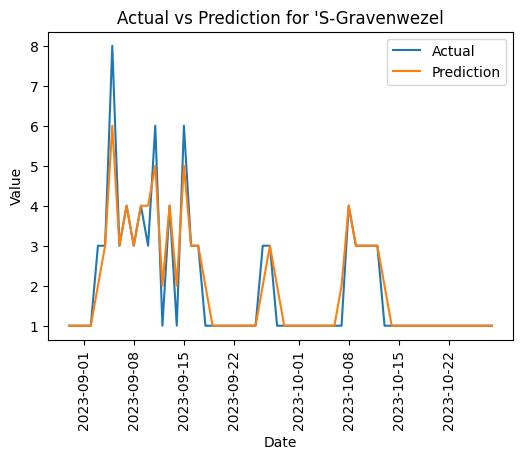

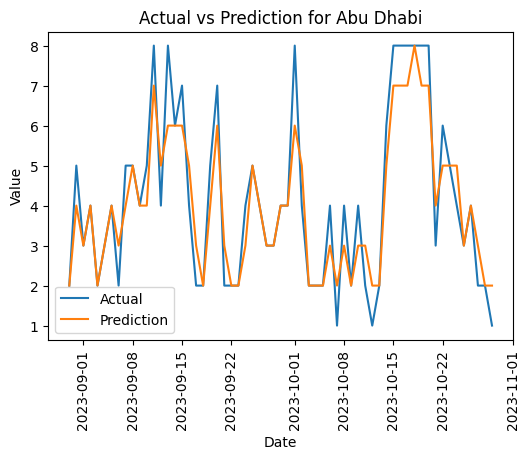

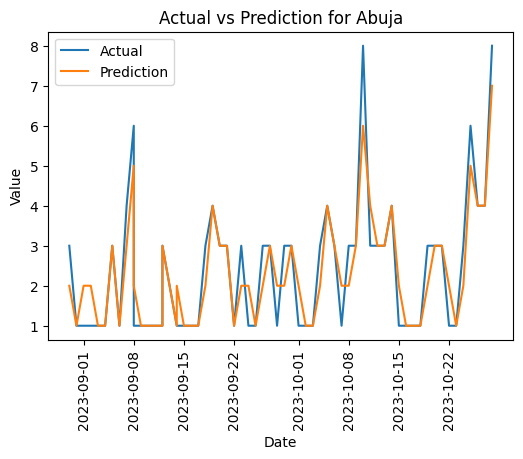

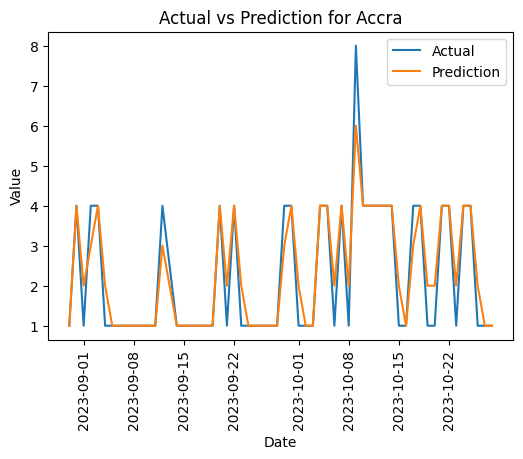

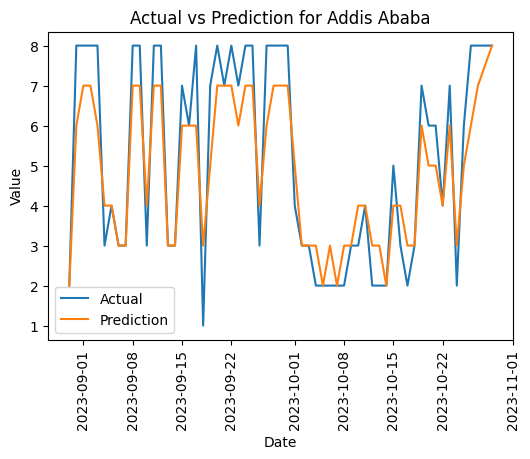

...

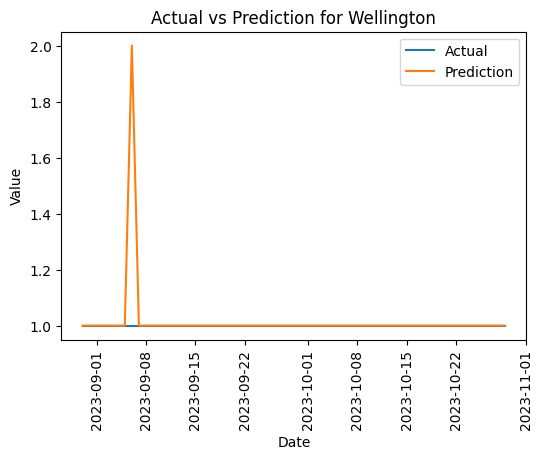

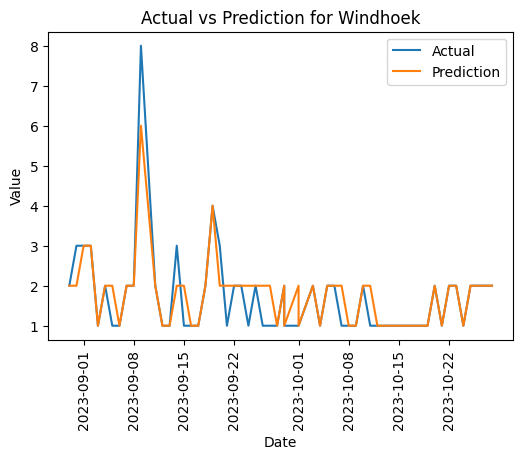

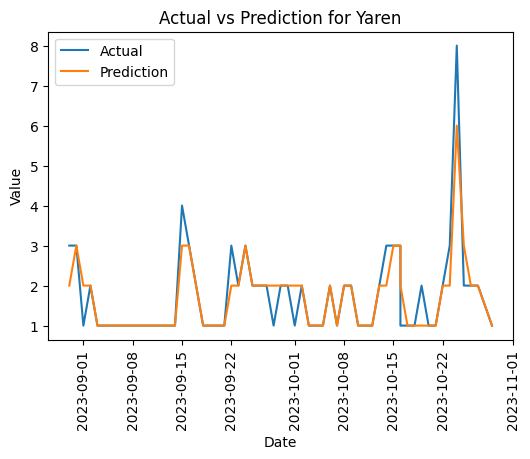

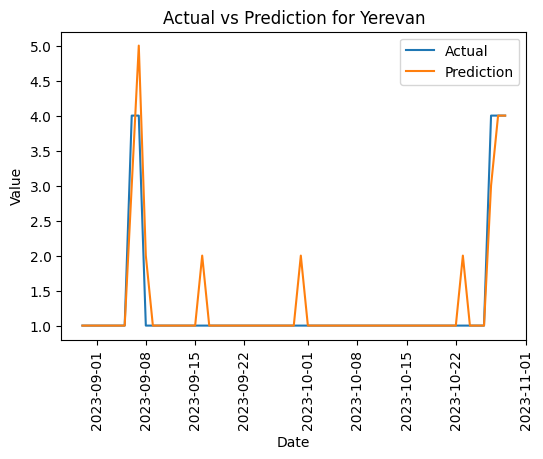

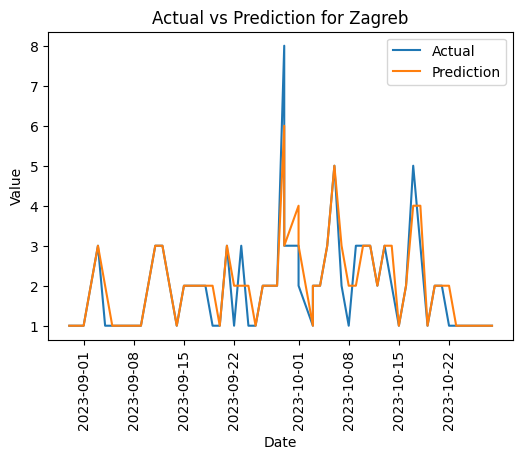

In [ ]:
# Plotting the result
# Loop over the articles
for article in result_train['location_name'].unique():
    # Get the data for the current article
    data = result_train[result_train['location_name'] == article]

     # Sort the data by date
    data = data.sort_values(by='Date')
    data = data.set_index('Date')

    # Plot the actual vs prediction
    plt.figure(figsize=(6,4))
    plt.plot(data['Actual'], label='Actual')
    plt.plot(data['Prediction'], label='Prediction')
    plt.title(f'Actual vs Prediction for {article}')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.legend()
    plt.xticks(rotation=90)
    plt.show()

Trying the case of congo

In [ ]:
congo = data.query('location_name == "Kinshasa"')
congo

,location_name,temperature_celsius,wind_mph,wind_degree,wind_direction,pressure_mb,precip_mm,humidity,cloud,feels_like_celsius,visibility_km,uv_index,gust_mph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_gb-defra-index
last_updated,,,,,,,,,,,,,,,,,,,,
2023-08-29,Kinshasa,31.1,5.6,231,SW,1015.0,0.00,50,60,33.4,10.0,8.0,6.5,540.7,38.6,2.0,1.0,7.8,22.3,1
2023-08-30,Kinshasa,24.0,4.3,240,WSW,1014.0,0.00,78,0,25.6,8.0,1.0,8.3,767.7,18.6,4.3,0.6,38.4,51.3,4
2023-08-31,Kinshasa,26.6,6.3,249,WSW,1011.0,0.00,50,8,27.2,10.0,1.0,11.6,667.6,32.2,2.2,0.3,17.6,27.1,2
2023-09-01,Kinshasa,25.9,6.3,261,W,1011.0,0.00,49,16,26.4,10.0,1.0,12.1,540.7,27.2,1.5,0.3,3.3,15.3,1
2023-09-02,Kinshasa,26.0,9.4,260,W,1014.0,0.00,65,0,26.4,8.0,1.0,12.3,821.1,50.1,2.6,0.4,19.7,30.4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-10-25,Kinshasa,27.0,8.1,290,WNW,1011.0,0.15,70,0,31.1,9.0,1.0,9.4,393.9,7.3,2.9,0.5,3.9,27.0,1
2023-10-26,Kinshasa,22.0,15.0,70,ENE,1017.0,0.00,94,75,24.5,4.0,1.0,6.9,397.2,8.1,2.4,0.4,2.8,17.6,1
2023-10-27,Kinshasa,25.0,6.9,180,S,1013.0,0.00,94,25,27.3,8.0,1.0,3.6,1281.7,0.0,5.0,2.9,45.4,188.8,5


In [ ]:
# Ensuring that index is of type datetime
congo.index = pd.to_datetime(congo.index)

# selecting the day for projection
info = congo.loc['2023-10-28']
info_df = pd.DataFrame(info).transpose()
info_df

,location_name,temperature_celsius,wind_mph,wind_degree,wind_direction,pressure_mb,precip_mm,humidity,cloud,feels_like_celsius,visibility_km,uv_index,gust_mph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_gb-defra-index
2023-10-28,Kinshasa,29.0,2.2,60,ENE,1010.0,0.07,62,0,34.0,9.0,1.0,4.6,1094.8,0.0,12.3,2.1,39.3,199.5,4


In [ ]:
# Making a copy of congo dataframe
info_df_labeled = info_df.copy()
info_df_labeled['wind_direction'] = le.transform(info_df_labeled['wind_direction'])
info_df_labeled

,location_name,temperature_celsius,wind_mph,wind_degree,wind_direction,pressure_mb,precip_mm,humidity,cloud,feels_like_celsius,visibility_km,uv_index,gust_mph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_gb-defra-index
2023-10-28,Kinshasa,29.0,2.2,60,1,1010.0,0.07,62,0,34.0,9.0,1.0,4.6,1094.8,0.0,12.3,2.1,39.3,199.5,4


In [ ]:
#Making a copy of the labeled data
info_df_scaled = info_df_labeled.copy()

# Scaling data
for col in info_df.columns[1:]:
  info_df_scaled[col] = scalers[col].transform(info_df_scaled[[col]]).reshape(-1,1)

  # Making predction
  prediction_congo = model.predict(info_df_scaled.iloc[:,1:])

  # Invertign prediction
  prediction_congo_inv = scalers['air_quality_gb-defra-index'].inverse_transform(prediction_congo.reshape(-1,1))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
/

In [ ]:
#3 Removing dimensions in the prediction
prediction_congo_inv = prediction_congo_inv[0][0]
prediction_congo_inv

3.2894999999999994

In [ ]:
#indices = [congo.loc['2023-10-27'].name, congo.loc['2023-10-28'].name]
prediction_congo_inv_df = pd.DataFrame(prediction_congo_inv, index = [congo.loc['2023-10-29'].name] , columns=['projected air_quality_gb-defra-index'])
prediction_congo_inv_df

,projected air_quality_gb-defra-index
2023-10-29,3.2895


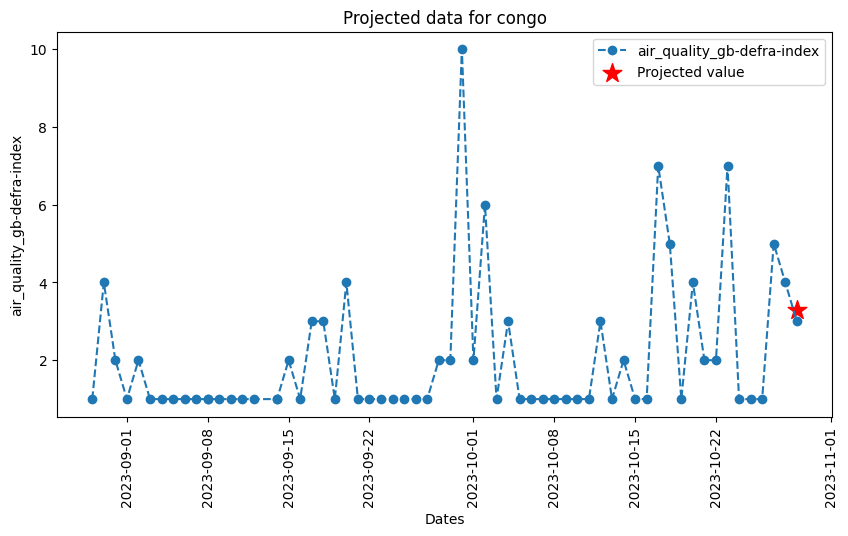

In [ ]:
plt.figure(figsize=(10,5))
plt.plot(congo['air_quality_gb-defra-index'], label='air_quality_gb-defra-index', ls='--', marker='o')
plt.scatter(prediction_congo_inv_df.index, prediction_congo_inv_df['projected air_quality_gb-defra-index'], color='red', label = 'Projected value', marker='*', s=200)
plt.title('Projected data for congo')
plt.ylabel('air_quality_gb-defra-index')
plt.xlabel('Dates')
plt.legend()
plt.xticks(rotation = 90);

In [ ]:
# Getting the data for next projection
info = congo.loc['2023-10-29']
info_df = pd.DataFrame(info).transpose()

# Making a copy of congo dataframe
info_df_labeled = info_df.copy()
info_df_labeled['wind_direction'] = le.transform(info_df_labeled['wind_direction'])
info_df_labeled

,location_name,temperature_celsius,wind_mph,wind_degree,wind_direction,pressure_mb,precip_mm,humidity,cloud,feels_like_celsius,visibility_km,uv_index,gust_mph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_gb-defra-index
2023-10-29,Kinshasa,29.0,2.2,10,3,1008.0,0.0,70,25,32.9,8.0,1.0,3.8,1134.9,0.0,5.8,3.0,35.1,193.5,3


In [ ]:
#Making a copy of the labeled data
info_df_scaled = info_df_labeled.copy()

# Scaling data
for col in info_df.columns[1:]:
  info_df_scaled[col] = scalers[col].transform(info_df_scaled[[col]]).reshape(-1,1)

  # Making predction
  prediction_congo = model.predict(info_df_scaled.iloc[:,1:])

  # Invertign prediction
  prediction_congo_inv = scalers['air_quality_gb-defra-index'].inverse_transform(prediction_congo.reshape(-1,1))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
/

In [ ]:
# Removing dimesntion from the prediction
prediction_congo_inv = prediction_congo_inv[0][0]
prediction_congo_inv

3.6116111111111113

In [ ]:
# Create a new DataFrame with the projection
new_data = pd.DataFrame({'projected air_quality_gb-defra-index': [prediction_congo_inv]}, index=pd.to_datetime(['2023-10-30']))

# Append the new data to your existing DataFrame
prediction_congo_inv_df = prediction_congo_inv_df.append(new_data)

<ipython-input-127-2e777fded2b0>:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  prediction_congo_inv_df = prediction_congo_inv_df.append(new_data)


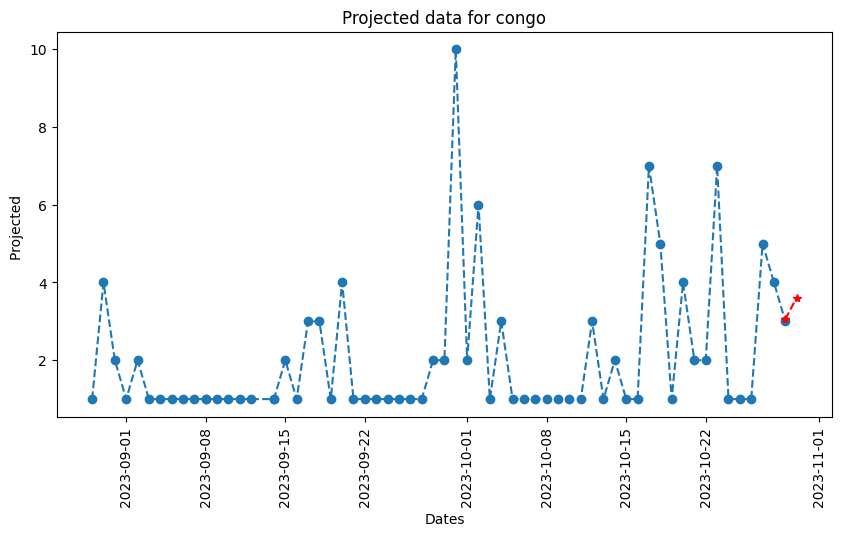

In [ ]:
# Plot the data
plt.figure(figsize=(10,5))
plt.plot(congo['air_quality_gb-defra-index'], label='air_quality_gb-defra-index', ls='--', marker='o')
plt.title('Projected data for congo')
plt.ylabel('Air Quality GB-DEFRA Index')
plt.plot(prediction_congo_inv_df.index, prediction_congo_inv_df['projected air_quality_gb-defra-index'], color='red', ls = '--',label = 'Projected value', marker='*')
plt.xlabel('Dates')
plt.ylabel('Projected ')
plt.xticks(rotation = 90);

Explainability

In [ ]:
! pip install lime
import lime
from lime import lime_tabular

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=f8da6b0890ee799763e8b3c4df58712c1ef2ee41e980c7e15b8205366ded26ec
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
# Defining the names of features
feature_names = ['temperature_celsius', 'wind_mph','wind_degree', 'wind_direction',
                          'pressure_mb', 'precip_mm', 'humidity','cloud', 'feels_like_celsius', 'visibility_km', 'uv_index',
                          'gust_mph','air_quality_Carbon_Monoxide', 'air_quality_Ozone','air_quality_Nitrogen_dioxide',
                          'air_quality_Sulphur_dioxide','air_quality_PM2.5', 'air_quality_PM10', 'air_quality_gb-defra-index']

# Create a LimeTabularExplainer (replace Xtrain_reshaped[:,1:] and feature_names with your own)
explainer = lime.lime_tabular.LimeTabularExplainer(Xtrain_reshaped[:,1:], feature_names=feature_names, mode='regression')

# Defining an instance
test_instance = assumptions_df.iloc[2,1:].values

# Scale your test instance using the fitted scalers
test_instance_scaled = np.array([scalers[col].transform([[val]])[0,0] for col, val in zip(feature_names, test_instance[1:])])

# Get the prediction for the scaled test instance
pred = model.predict(test_instance_scaled.reshape(1,-1))

# Inverse transform the scaled test instance for explanation
test_instance_inverse_transformed = np.array([scalers[col].inverse_transform([[val]])[0,0] for col, val in zip(feature_names, test_instance_scaled)])

# Generate an explanation with LIME on the inverse transformed (original) test instance
explanation = explainer.explain_instance(test_instance_inverse_transformed, model.predict, num_features=19)

# Show the explanation
explanation.show_in_notebook()

In [ ]:
!pip install eli5
import eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107719 sha256=eabc04de8c7b720314199c3eb5a185be7d8aa1aa36f81dd59314e07d4a6c8cf9
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
eli5.show_weights(model, feature_names=feature_names)

Weight,Feature
0.4011 ± 0.0238,air_quality_gb-defra-index
0.0710 ± 0.0160,air_quality_PM2.5
0.0441 ± 0.0127,gust_mph
0.0403 ± 0.0134,air_quality_Ozone
0.0401 ± 0.0142,air_quality_Carbon_Monoxide
0.0399 ± 0.0118,feels_like_celsius
0.0398 ± 0.0126,air_quality_Sulphur_dioxide
0.0390 ± 0.0121,pressure_mb
0.0381 ± 0.0131,air_quality_PM10
0.0376 ± 0.0139,air_quality_Nitrogen_dioxide


In [ ]:
from sklearn.inspection import PartialDependenceDisplay
#from sklearn.datasets import make_friedman1

In [ ]:
congo.columns

Index(['location_name', 'temperature_celsius', 'wind_mph', 'wind_degree',
       'wind_direction', 'pressure_mb', 'precip_mm', 'humidity', 'cloud',
       'feels_like_celsius', 'visibility_km', 'uv_index', 'gust_mph',
       'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
       'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
       'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_gb-defra-index'],
      dtype='object')

In [ ]:
Xtrain_reshaped_df = pd.DataFrame(Xtrain_reshaped, columns=congo.columns)

In [ ]:
Xtrain_reshaped_df

,location_name,temperature_celsius,wind_mph,wind_degree,wind_direction,pressure_mb,precip_mm,humidity,cloud,feels_like_celsius,visibility_km,uv_index,gust_mph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_gb-defra-index
0,'S-Gravenwezel,0.733333,0.164062,0.783699,0.866667,0.673913,0.0,0.477273,0.25,0.74359,1.0,0.8,0.157343,0.012673,0.406469,0.341346,0.493506,0.10984,0.105341,0.0
1,'S-Gravenwezel,0.466667,0.164062,0.438871,0.666667,0.586957,0.0,0.590909,0.75,0.455128,1.0,0.0,0.27972,0.294931,0.299825,0.483173,0.727273,0.208238,0.178042,0.0
2,'S-Gravenwezel,0.333333,0.265625,0.658307,0.8,0.608696,1.0,0.863636,0.0,0.288462,1.0,0.0,0.304196,0.217742,0.406469,0.432692,0.766234,0.144165,0.151335,0.0
3,'S-Gravenwezel,0.533333,0.265625,0.376176,0.6,0.673913,0.0,0.863636,0.0,0.525641,1.0,0.0,0.22028,0.192396,0.450175,0.276442,0.285714,0.05492,0.043027,0.0
4,'S-Gravenwezel,0.733333,0.0,0.639498,0.8,0.76087,0.789474,0.863636,1.0,0.74359,0.74359,0.0,0.164336,0.140937,0.0,0.473558,0.480519,0.10984,0.093472,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11876,Zagreb,0.55,0.367188,0.685714,1.0,0.617647,0.0,0.465116,0.0,0.473214,1.0,0.0,0.742268,0.083385,0.593602,0.101695,0.037037,0.049285,0.068548,0.0
11877,Zagreb,0.65,0.125,0.085714,0.266667,0.235294,0.04329,0.72093,0.0,0.602679,1.0,0.0,0.814433,0.033329,0.796209,0.053455,0.037037,0.066773,0.107527,0.0
11878,Zagreb,0.6,0.460938,0.571429,0.733333,0.264706,0.0,0.581395,0.0,0.53125,1.0,0.0,0.623711,0.033329,0.695498,0.052151,0.074074,0.011129,0.018817,0.0
11879,Zagreb,0.65,0.0,1.0,0.2,0.176471,0.038961,0.581395,0.75,0.602679,1.0,0.0,0.525773,0.016727,0.830569,0.018253,0.074074,0.0,0.0,0.0


Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius
Feature: temperature_celsius


ValueError: ignored

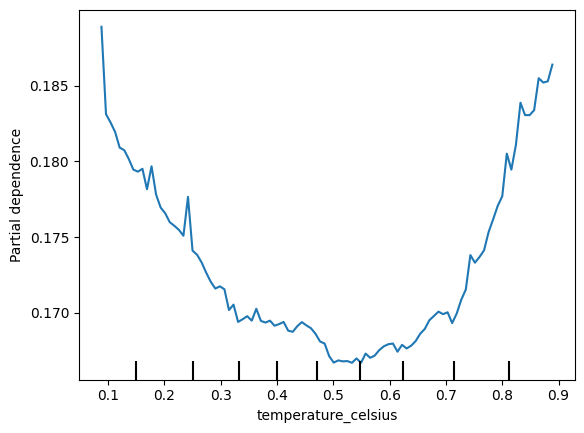

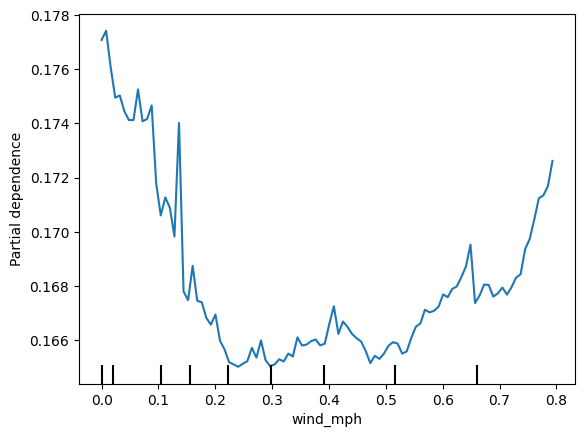

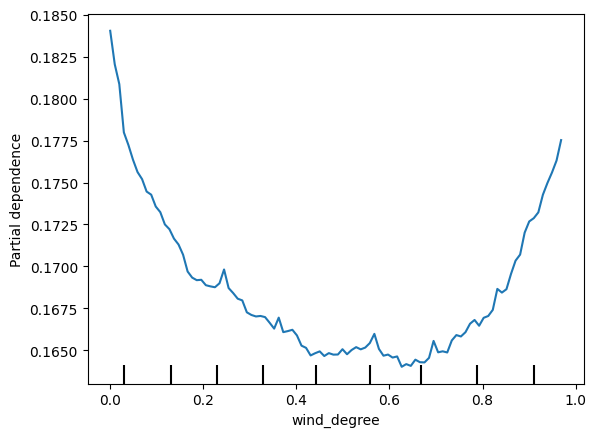

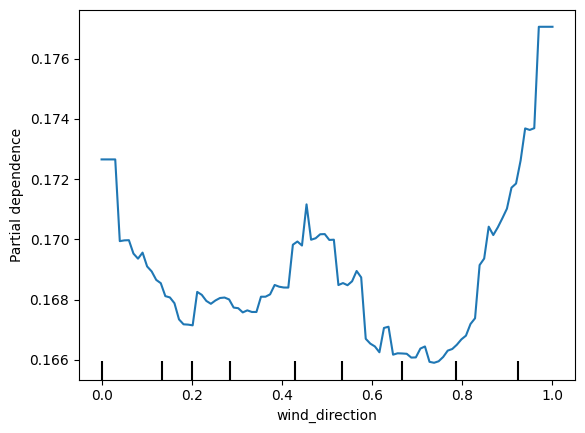

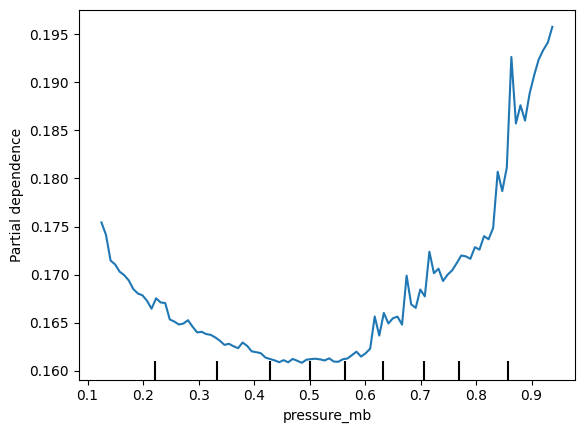

...

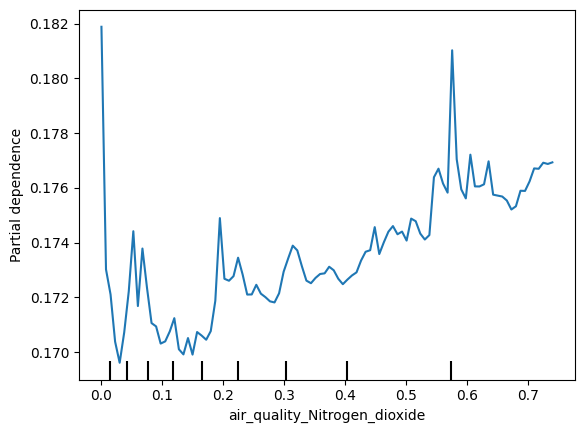

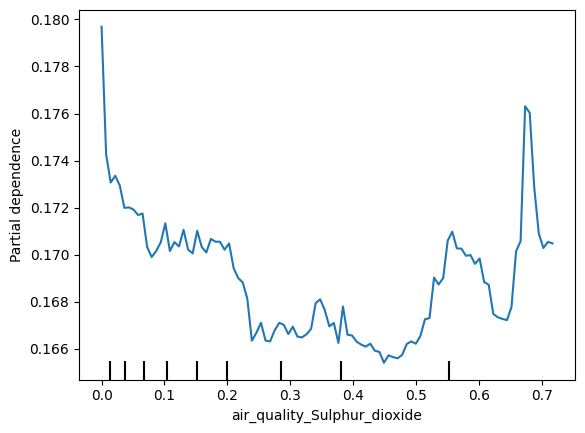

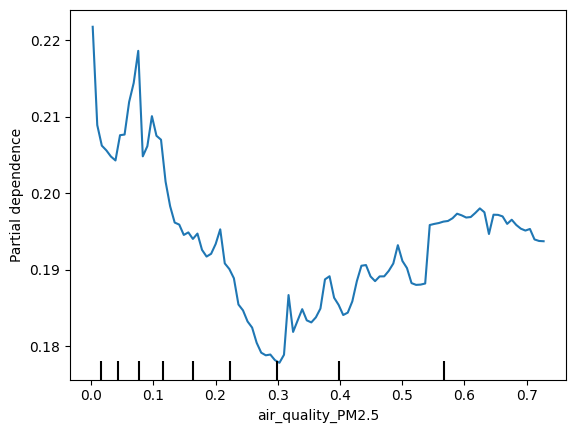

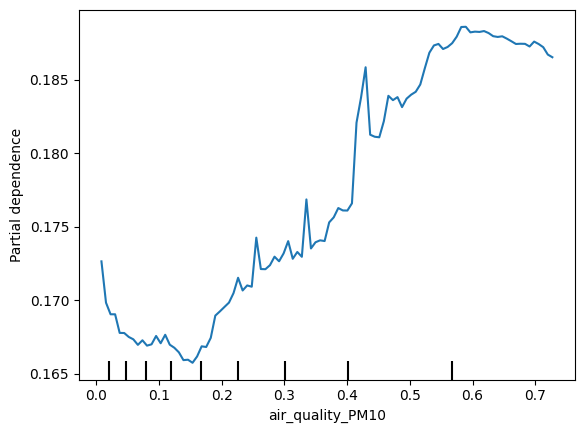

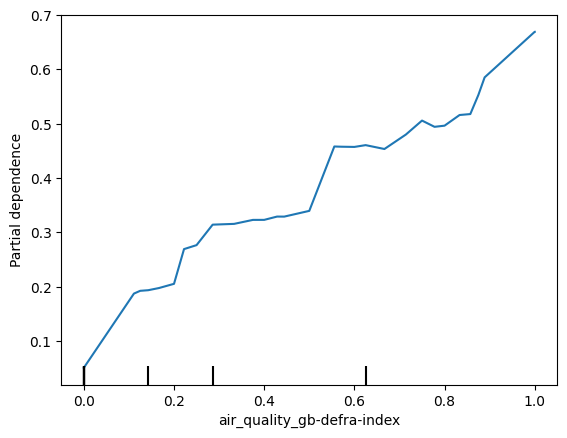

In [ ]:
# Train a Random Forest model
clf = RandomForestRegressor().fit(Xtrain_reshaped_df.iloc[:,1:], ytrain)
feature_names = ['location_name', 'temperature_celsius', 'wind_mph', 'wind_degree',
       'wind_direction', 'pressure_mb', 'precip_mm', 'humidity', 'cloud',
       'feels_like_celsius', 'visibility_km', 'uv_index', 'gust_mph',
       'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
       'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
       'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_gb-defra-index']

for i in range(len(feature_names)):
    display = PartialDependenceDisplay.from_estimator(clf, Xtrain_reshaped_df.iloc[:,1:], [i])
    print(f"Feature: {display.feature_names[0]}")
    #print(f"Values: {display.pd_results[0][0]}")
    #print(f"Average Predicted Outcome: {display.pd_results[0][1]}")

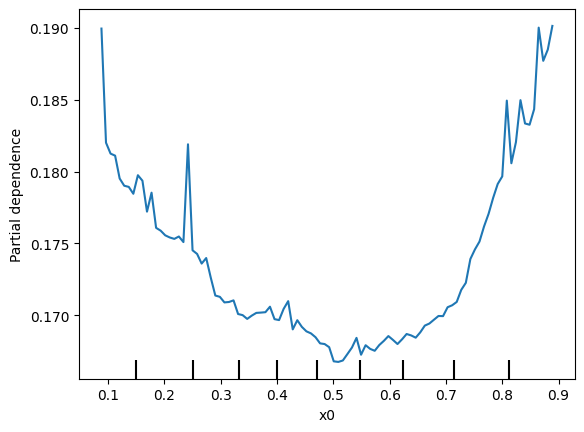

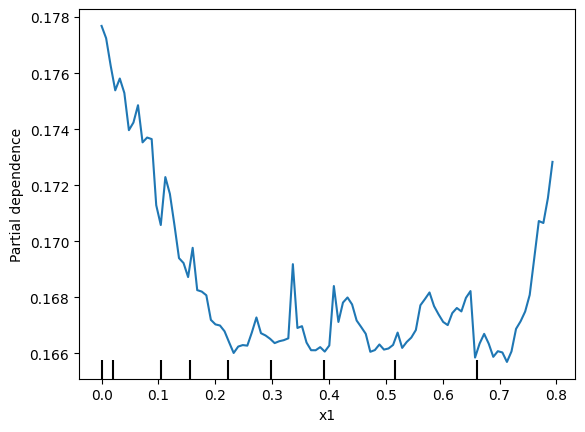

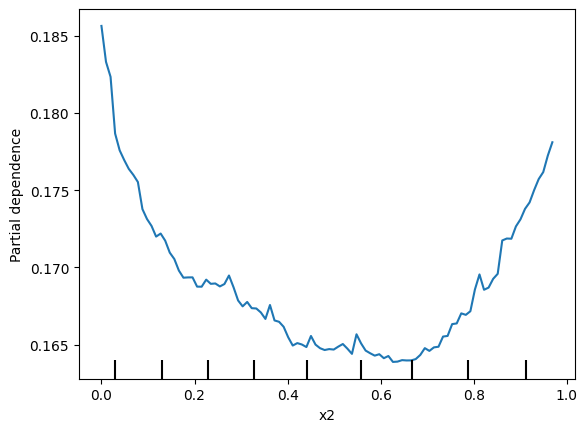

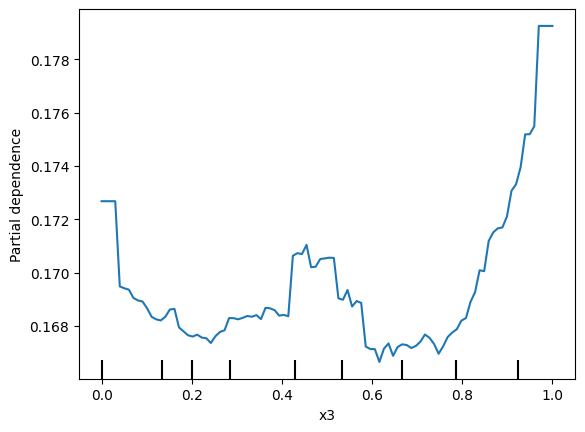

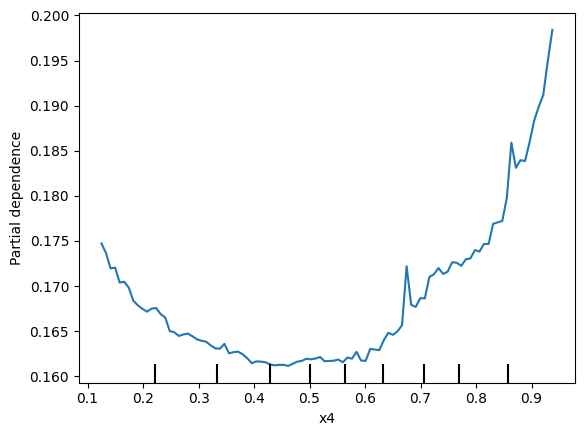

...

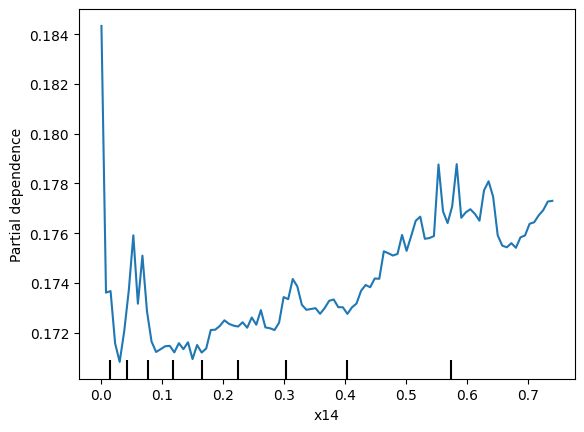

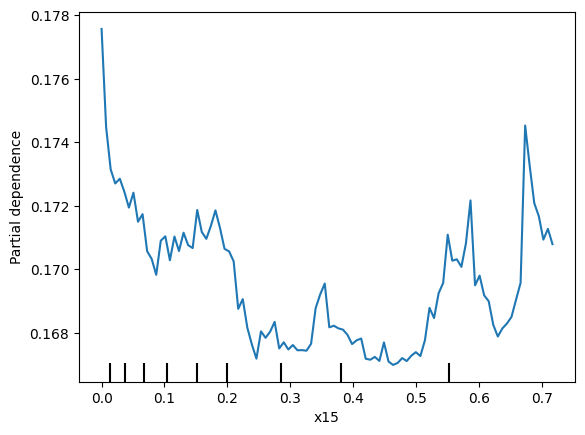

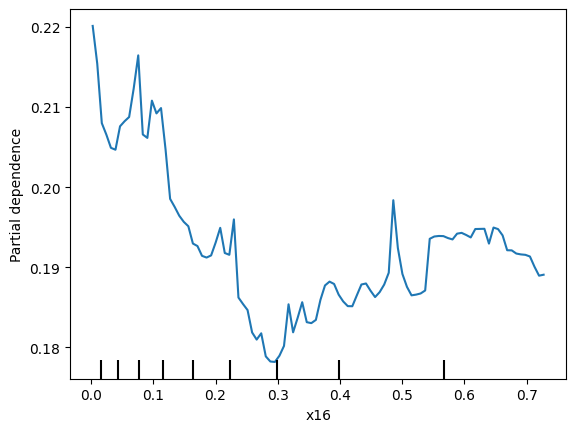

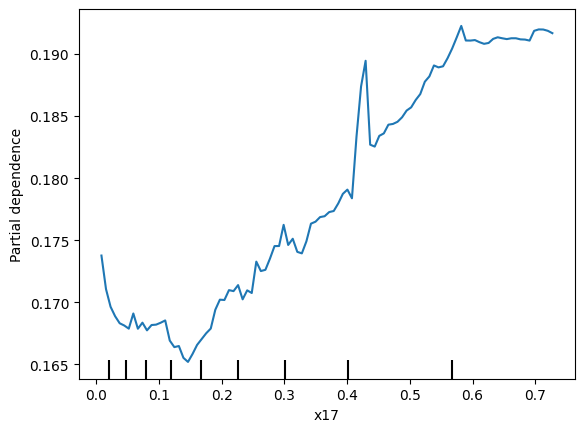

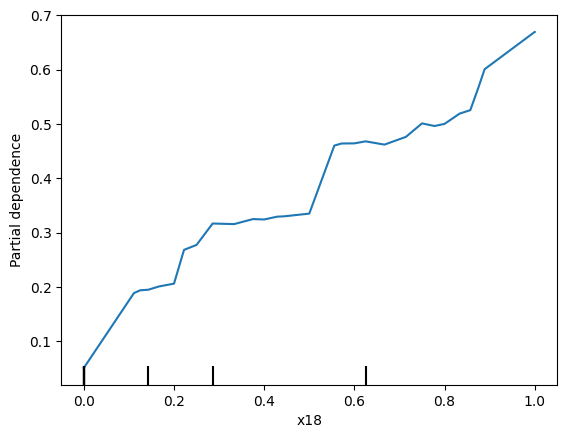

In [ ]:
# Train a Random Forest model
clf = RandomForestRegressor().fit(Xtrain_reshaped_df.iloc[:,1:], ytrain)

for i in range(len(feature_names)):
    PartialDependenceDisplay.from_estimator(clf, Xtrain_reshaped_df.iloc[:,1:], [i])

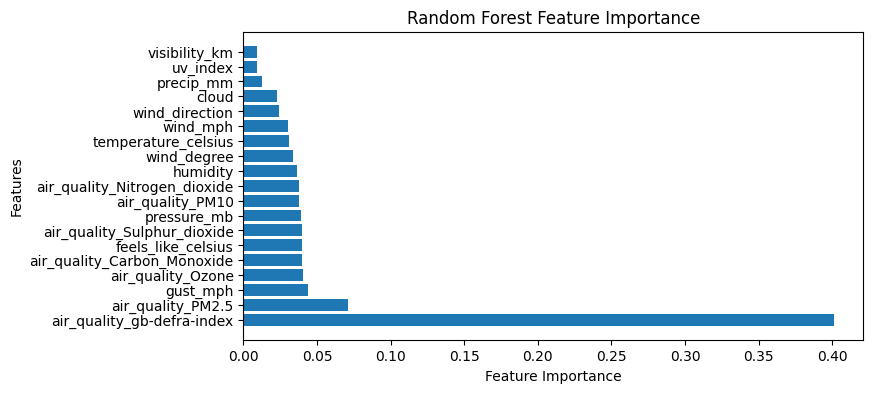

In [ ]:
# Get feature names and importances
feature_names = feature_names
importance_scores = model.feature_importances_

# Convert feature_names to numpy array
feature_names = np.array(feature_names)

# Sort feature importance scores and  names in descending order
sorted_indices = importance_scores.argsort()[::-1]
sorted_importance_scores = importance_scores[sorted_indices]
sorted_feature_names = feature_names[sorted_indices]

# Plot the feature importance
plt.figure(figsize=(8, 4))
plt.barh(range(len(sorted_importance_scores)), sorted_importance_scores, tick_label=sorted_feature_names)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Random Forest Feature Importance')
plt.show()

In [ ]:
# End